<a href="https://colab.research.google.com/github/noamjgal/introtogeoai/blob/main/opengeos_geoai.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## GEOAI Package Exploration

In [ ]:
%pip install geoai-py

## Testing

In [ ]:
import geoai

In [ ]:
geoai.__version__

'0.12.0'

## Import Libraries
These modules allow downloading NAIP imagery and extracting building data statistics.

In [ ]:
import leafmap
from geoai.downlohad import (
    download_overture_buildings,
    extract_building_stats,
)

## Define Bounding Box
Define the geographic extent (longitude and latitude) for data downloads.

In [ ]:
m = leafmap.Map(center=[47.6526, -117.5923], zoom=16)
m.add_basemap("Esri.WorldImagery")
m

Map(center=[47.6526, -117.5923], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', '…

Use the drawing tools to draw a rectangle on the map. If no rectangle is drawn, the default ROI will be used.

In [ ]:
bbox = m.user_roi_bounds()
if bbox is None:
    bbox = (-117.6029, 47.65, -117.5936, 47.6563)

## Download NAIP Imagery
Fetch NAIP aerial imagery for the specified bounding box. The `max_items` parameter limits the number of downloaded files.

In [ ]:
# Download NAIP imagery for the specified region
downloaded_files = download_naip(
    bbox=bbox,
    output_dir="naip_data",
    max_items=1,
    # year=2020,
)

print(f"Downloaded {len(downloaded_files)} files.")

Found 7 NAIP items.
Skipping existing file: naip_data/m_4711720_sw_11_060_20230701_20230911.tif


m_4711720_sw_11_060_20210627.tif: 100%|██████████| 342M/342M [01:40<00:00, 3.56MiB/s]


Successfully saved to naip_data/m_4711720_sw_11_060_20210627.tif


m_4711720_sw_11_060_20190726.tif: 100%|██████████| 359M/359M [01:25<00:00, 4.42MiB/s]


Successfully saved to naip_data/m_4711720_sw_11_060_20190726.tif


m_4711720_sw_11_1_20170717.tif: 100%|██████████| 128M/128M [00:31<00:00, 4.19MiB/s]


Successfully saved to naip_data/m_4711720_sw_11_1_20170717.tif


m_4711720_sw_11_1_20150702.tif: 100%|██████████| 118M/118M [00:32<00:00, 3.81MiB/s]


Successfully saved to naip_data/m_4711720_sw_11_1_20150702.tif


m_4711720_sw_11_1_20130628.tif: 100%|██████████| 139M/139M [00:36<00:00, 4.03MiB/s]


Successfully saved to naip_data/m_4711720_sw_11_1_20130628.tif


m_4711720_sw_11_1_20110702.tif: 100%|██████████| 128M/128M [00:31<00:00, 4.21MiB/s]

Successfully saved to naip_data/m_4711720_sw_11_1_20110702.tif
Downloaded 7 files.


## Download Building Data
Retrieve building footprint data in GeoJSON format within the bounding box. The `verbose` flag provides detailed output.

In [ ]:
# Download buildings
data_file = download_overture_buildings(
    bbox=bbox,
    output="buildings.geojson",
)

## Extract Building Statistics
If the building data file is successfully downloaded, extract and display relevant statistics such as area, count, and footprint details.

In [ ]:
stats = extract_building_stats(data_file)
print(stats)

{'total_buildings': 256, 'has_height': 207, 'has_name': 0, 'bbox': [-117.5943908, 47.6449009, -117.586482, 47.649866]}


## Visualize Datasets

In [ ]:
m = leafmap.Map()
m.add_raster("naip_data/m_4711720_sw_11_060_20230701_20230911.tif", layer_name="NAIP")
m.add_geojson("buildings.geojson", layer_name="Buildings")
m

Map(center=[47.656247, -117.5938195], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_titl…

# View Metadata

Define URLs for sample datasets: a NAIP imagery raster file and a building footprints vector file

In [30]:
raster_url = (
    "https://huggingface.co/datasets/giswqs/geospatial/resolve/main/naip_train.tif"
)
vector_url = "https://huggingface.co/datasets/giswqs/geospatial/resolve/main/naip_train_buildings.geojson"

Download the raster file (NAIP imagery) and save it locally

In [31]:
raster_path = geoai.download_file(raster_url)

Download the vector file (building footprints) and save it locally

In [32]:
vector_path = geoai.download_file(vector_url)

Display metadata about the raster file, including dimensions, resolution, projection, and bands

In [34]:
geoai.get_raster_info(raster_path)["band_stats"]

[{'band': 1,
  'min': 12.0,
  'max': 251.0,
  'mean': 150.6730747259594,
  'std': 48.01908734374099},
 {'band': 2,
  'min': 49.0,
  'max': 251.0,
  'mean': 141.92468895229808,
  'std': 43.46595463573497},
 {'band': 3,
  'min': 53.0,
  'max': 251.0,
  'mean': 120.89909373405554,
  'std': 41.78086244480775},
 {'band': 4,
  'min': 22.0,
  'max': 251.0,
  'mean': 159.68995855062735,
  'std': 54.95588423977727}]

===== RASTER INFORMATION: naip_train.tif =====
Driver: GTiff
Dimensions: 2503 x 1126 pixels
Number of bands: 4
Data type: uint8
Coordinate Reference System: EPSG:26911
Georeferenced Bounds: BoundingBox(left=454780.8, bottom=5277567.0, right=456282.6, top=5278242.6)
Pixel Resolution: 0.5999999999999953, 0.5999999999996691
NoData Value: None

----- Band Statistics -----
Band 1:
  Min: 12.00
  Max: 251.00
  Mean: 150.67
  Std Dev: 48.02
Band 2:
  Min: 49.00
  Max: 251.00
  Mean: 141.92
  Std Dev: 43.47
Band 3:
  Min: 53.00
  Max: 251.00
  Mean: 120.90
  Std Dev: 41.78
Band 4:
  Min: 22.00
  Max: 251.00
  Mean: 159.69
  Std Dev: 54.96


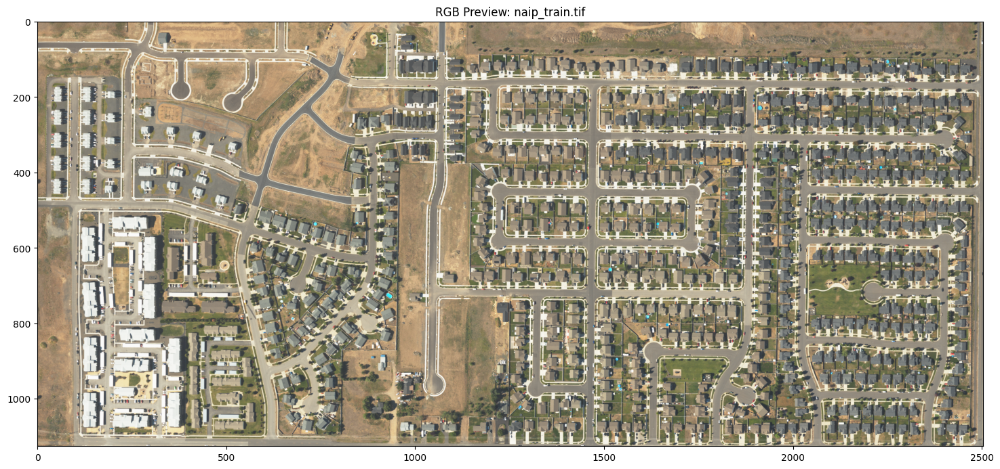

In [33]:
geoai.print_raster_info(raster_path, figsize=(18, 10))

Display metadata about the vector file, including geometry type, feature count, extent, and attributes

===== VECTOR INFORMATION: naip_train_buildings.geojson =====
Driver: GEOJSON
Feature count: 735
Geometry types: {'Polygon': 735}
Coordinate Reference System: EPSG:4326
Bounds: [-117.6017984, 47.65016239407519, -117.58246913360121, 47.655846]
Number of attributes: 3
Attribute names: id, height, class

----- Attribute Statistics -----
Attribute: id
  min: 1
  max: 735
  mean: 368.0000
  std: 212.3205
  null_count: 0
Attribute: height
  min: 0
  max: 0
  mean: 0.0000
  std: 0.0000
  null_count: 0


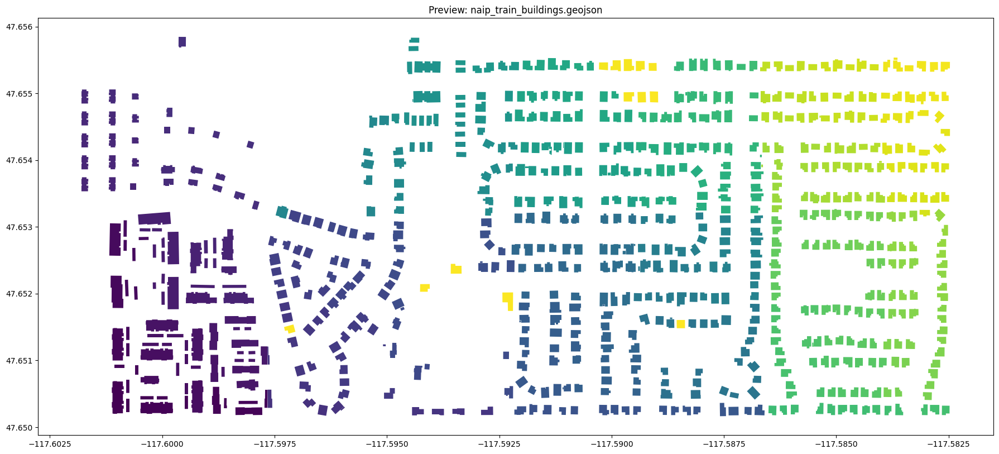

In [35]:
geoai.print_vector_info(vector_path, figsize=(18, 10))

Analyze the "height" attribute of buildings to obtain statistical information

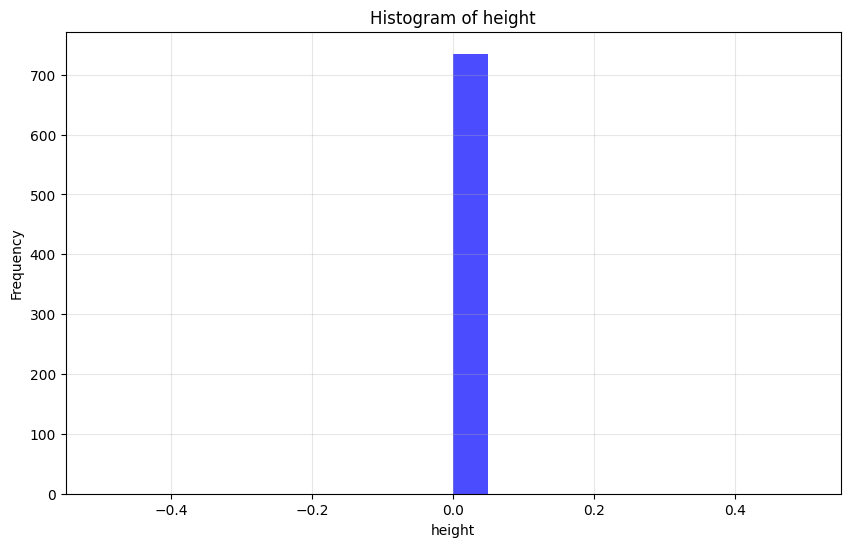

{'attribute': 'height',
 'type': 'numeric',
 'count': np.int64(735),
 'null_count': np.int64(0),
 'min': 0,
 'max': 0,
 'mean': np.float64(0.0),
 'median': 0.0,
 'std': 0.0,
 'unique_values': 1}

In [36]:
geoai.analyze_vector_attributes(vector_path, "height")

Create a visualization of building footprints colored by their height values

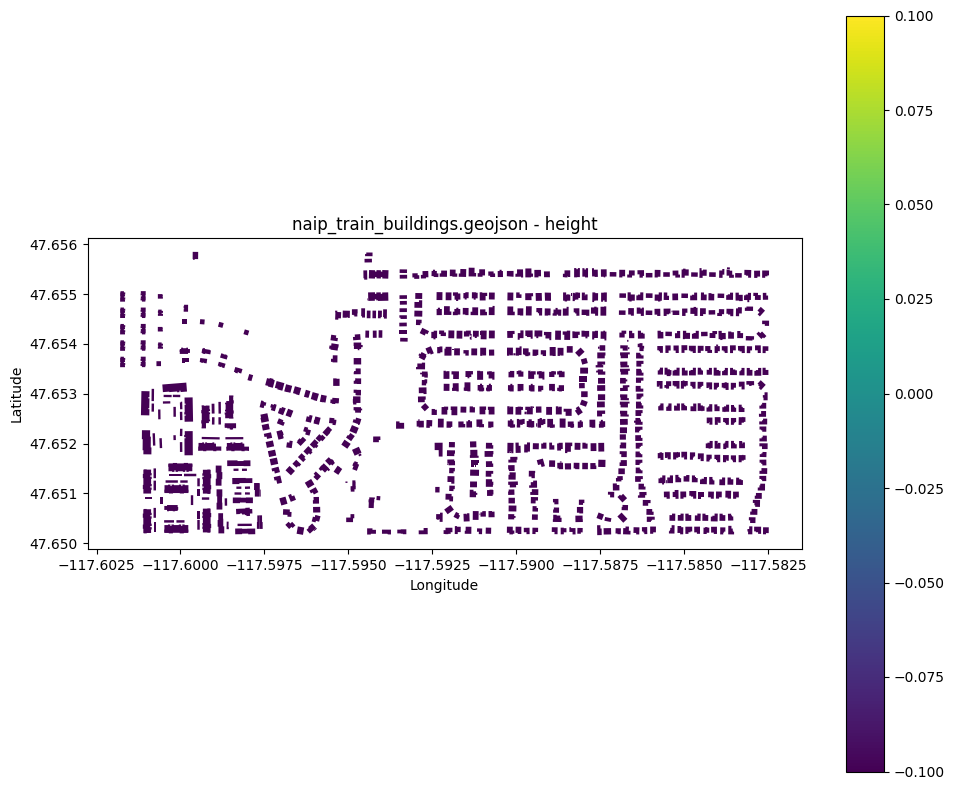

In [37]:
geoai.visualize_vector_by_attribute(vector_path, "height")

Clip the raster file to a specified extent

In [39]:
clip_raster_path = "naip_clip.tif"
geoai.clip_raster_by_bbox(
    raster_path,
    clip_raster_path,
    bbox=(0, 0, 500, 500),
    bands=[1, 2, 3],
    bbox_type="pixel",
)

'naip_clip.tif'

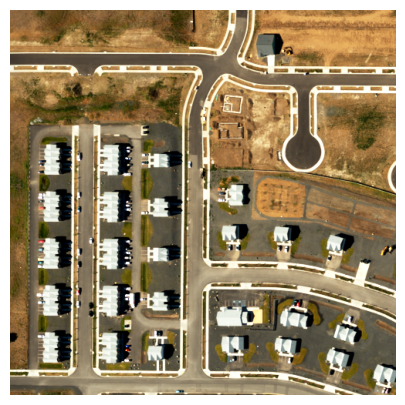

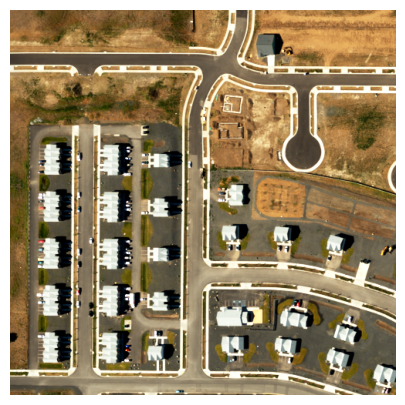

In [40]:
geoai.view_image(clip_raster_path)